In [295]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.tsa.api as smt

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Flatten, TimeDistributed, GRU
from keras.layers.convolutional import Conv1D, MaxPooling1D


%matplotlib inline

pd.options.display.max_rows = 1000

In [374]:
#load the csv
df = pd.read_csv('Air_Traffic_Statistics.csv', sep = ';')
df

,Airports,Periods,Aircraft movements/Cross-country flights (number),Aircraft movements/Local flights (number),Commercial air traffic/Flights/All flights/Total flights (number),Commercial air traffic/Flights/All flights/Scheduled (number),Commercial air traffic/Flights/All flights/Non-scheduled (number),Commercial air traffic/Flights/Arrivals/Total arrivals flights (number),Commercial air traffic/Flights/Arrivals/Scheduled (number),Commercial air traffic/Flights/Arrivals/Non-scheduled (number),...,Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Africa/South Africa (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/North America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/Central America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/South America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/West Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/South-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/North-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Oceania (ton)
0,Amsterdam Airport Schiphol,1999 January,30391,672,29640,28177,1463,14816,14103,713,...,.,.,.,.,.,.,.,.,.,.
1,Amsterdam Airport Schiphol,1999 February,28302,550,27526,26080,1446,13760,13047,713,...,.,.,.,.,.,.,.,.,.,.
2,Amsterdam Airport Schiphol,1999 March,32595,784,31473,29746,1727,15745,14878,867,...,.,.,.,.,.,.,.,.,.,.
3,Amsterdam Airport Schiphol,1999 April,33069,858,32013,29834,2179,15999,14914,1085,...,.,.,.,.,.,.,.,.,.,.
4,Amsterdam Airport Schiphol,1999 May,35221,732,34133,30743,3390,17070,15369,1701,...,.,.,.,.,.,.,.,.,.,.
5,Amsterdam Airport Schiphol,1999 June,34707,828,33426,30391,3035,16715,15195,1520,...,.,.,.,.,.,.,.,.,.,.
6,Amsterdam Airport Schiphol,1999 July,36589,832,35529,31540,3989,17754,15763,1991,...,.,.,.,.,.,.,.,.,.,.
7,Amsterdam Airport Schiphol,1999 August,36485,678,35625,31518,4107,17818,15773,2045,...,.,.,.,.,.,.,.,.,.,.
8,Amsterdam Airport Schiphol,1999 September,35656,726,34411,31025,3386,17203,15515,1688,...,.,.,.,.,.,.,.,.,.,.
9,Amsterdam Airport Schiphol,1999 October,36292,620,35126,31991,3135,17566,15994,1572,...,.,.,.,.,.,.,.,.,.,.


In [331]:
#check no of rows and cols
df.shape

(1225, 104)

In [298]:
#get a short summary of datatypes and non-null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1225 entries, 0 to 1224
Columns: 104 entries, Airports to Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Oceania (ton)
dtypes: int64(67), object(37)
memory usage: 995.4+ KB


In [299]:
#check if there are any NAs
(df.astype(np.object).isnull()).any()
#there are no NAs
#if the were we would probably try to interpolate them, otherwise drop them with
#df.dropna(inplace=True) if they were too few 

Airports                                                                                                                       False
Periods                                                                                                                        False
Aircraft movements/Cross-country flights (number)                                                                              False
Aircraft movements/Local flights (number)                                                                                      False
Commercial air traffic/Flights/All flights/Total flights (number)                                                              False
Commercial air traffic/Flights/All flights/Scheduled (number)                                                                  False
Commercial air traffic/Flights/All flights/Non-scheduled (number)                                                              False
Commercial air traffic/Flights/Arrivals/Total arrivals flights (numbe

In [300]:
#get summary for numerical values
df.describe()

,Aircraft movements/Cross-country flights (number),Aircraft movements/Local flights (number),Commercial air traffic/Flights/All flights/Total flights (number),Commercial air traffic/Flights/All flights/Non-scheduled (number),Commercial air traffic/Flights/Arrivals/Total arrivals flights (number),Commercial air traffic/Flights/Arrivals/Non-scheduled (number),Commercial air traffic/Flights/Departures/Total departures flights (number),Commercial air traffic/Flights/Departures/Non-scheduled (number),Commercial air traffic/Passengers/Total passengers/Total passengers (number),Commercial air traffic/Passengers/Total passengers/Non-scheduled (number),...,Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/America/North America (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/America/Central America (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/America/South America (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Asia/Asia (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Asia/West Asia (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Asia/South-East Asia (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Asia/North-East Asia (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Oceania (ton),Commercial air traffic/Cargo/Country of origin/destination/Intercontinental cargo/Other/unknown (ton),Commercial air traffic/Cargo/Country of origin/destination/Unknown (ton)
count,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.00000,1225.000000,1225.000000,1.225000e+03,1225.000000,...,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000,1225.000000
mean,8665.335510,1580.030204,7908.667755,624.662857,3953.633469,312.60000,3955.034286,312.062857,8.888359e+05,71004.181224,...,4776.163265,700.937959,1808.977143,12803.351837,3384.933878,2638.524082,6779.889796,79.004082,20.995918,0.457959
std,14137.545886,1631.812693,14004.812144,1058.748274,7002.646968,529.82364,7002.169953,529.002244,1.683039e+06,151148.349244,...,9614.082643,1415.467243,3646.414195,25545.605509,6489.045767,5372.848386,14031.472252,246.413226,224.824716,6.388312
min,368.000000,0.000000,40.000000,0.000000,20.000000,0.00000,20.000000,0.000000,1.401000e+03,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1137.000000,282.000000,444.000000,76.000000,221.000000,39.00000,221.000000,37.000000,1.759200e+04,3242.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1760.000000,1066.000000,1157.000000,175.000000,576.000000,87.00000,580.000000,87.000000,6.143100e+04,10659.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3175.000000,2476.000000,2249.000000,400.000000,1125.000000,200.00000,1124.000000,203.000000,3.019540e+05,29093.000000,...,47.000000,0.000000,128.000000,1159.000000,997.000000,0.000000,100.000000,0.000000,0.000000,0.000000
max,47755.000000,7370.000000,46863.000000,4970.000000,23432.000000,2498.00000,23431.000000,2472.000000,6.836668e+06,746894.000000,...,30678.000000,5188.000000,13696.000000,86937.000000,21401.000000,19491.000000,53567.000000,1323.000000,4830.000000,106.000000


In [375]:
#split the Periods column so we get the year and the month separately 
df['Year'], df['Months'] = df['Periods'].str.split(' ', 1).str
df['Year'] = pd.to_numeric(df['Year'])
df

,Airports,Periods,Aircraft movements/Cross-country flights (number),Aircraft movements/Local flights (number),Commercial air traffic/Flights/All flights/Total flights (number),Commercial air traffic/Flights/All flights/Scheduled (number),Commercial air traffic/Flights/All flights/Non-scheduled (number),Commercial air traffic/Flights/Arrivals/Total arrivals flights (number),Commercial air traffic/Flights/Arrivals/Scheduled (number),Commercial air traffic/Flights/Arrivals/Non-scheduled (number),...,Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/North America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/Central America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/South America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/West Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/South-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/North-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Oceania (ton),Year,Months
0,Amsterdam Airport Schiphol,1999 January,30391,672,29640,28177,1463,14816,14103,713,...,.,.,.,.,.,.,.,.,1999,January
1,Amsterdam Airport Schiphol,1999 February,28302,550,27526,26080,1446,13760,13047,713,...,.,.,.,.,.,.,.,.,1999,February
2,Amsterdam Airport Schiphol,1999 March,32595,784,31473,29746,1727,15745,14878,867,...,.,.,.,.,.,.,.,.,1999,March
3,Amsterdam Airport Schiphol,1999 April,33069,858,32013,29834,2179,15999,14914,1085,...,.,.,.,.,.,.,.,.,1999,April
4,Amsterdam Airport Schiphol,1999 May,35221,732,34133,30743,3390,17070,15369,1701,...,.,.,.,.,.,.,.,.,1999,May
5,Amsterdam Airport Schiphol,1999 June,34707,828,33426,30391,3035,16715,15195,1520,...,.,.,.,.,.,.,.,.,1999,June
6,Amsterdam Airport Schiphol,1999 July,36589,832,35529,31540,3989,17754,15763,1991,...,.,.,.,.,.,.,.,.,1999,July
7,Amsterdam Airport Schiphol,1999 August,36485,678,35625,31518,4107,17818,15773,2045,...,.,.,.,.,.,.,.,.,1999,August
8,Amsterdam Airport Schiphol,1999 September,35656,726,34411,31025,3386,17203,15515,1688,...,.,.,.,.,.,.,.,.,1999,September
9,Amsterdam Airport Schiphol,1999 October,36292,620,35126,31991,3135,17566,15994,1572,...,.,.,.,.,.,.,.,.,1999,October


In [302]:
# Selecting one airline's flights against time to see how the time series look
df_explore_schiphol = df[(df['Airports'] == 'Amsterdam Airport Schiphol')]
df_explore_schiphol

,Airports,Periods,Aircraft movements/Cross-country flights (number),Aircraft movements/Local flights (number),Commercial air traffic/Flights/All flights/Total flights (number),Commercial air traffic/Flights/All flights/Scheduled (number),Commercial air traffic/Flights/All flights/Non-scheduled (number),Commercial air traffic/Flights/Arrivals/Total arrivals flights (number),Commercial air traffic/Flights/Arrivals/Scheduled (number),Commercial air traffic/Flights/Arrivals/Non-scheduled (number),...,Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/North America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/Central America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/America/South America (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/West Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/South-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Asia/North-East Asia (ton),Commercial air traffic/Mail/Country of origin/destination mail/Intercontinental mail/Oceania (ton),Year,Months
0,Amsterdam Airport Schiphol,1999 January,30391,672,29640,28177,1463,14816,14103,713,...,.,.,.,.,.,.,.,.,1999,January
1,Amsterdam Airport Schiphol,1999 February,28302,550,27526,26080,1446,13760,13047,713,...,.,.,.,.,.,.,.,.,1999,February
2,Amsterdam Airport Schiphol,1999 March,32595,784,31473,29746,1727,15745,14878,867,...,.,.,.,.,.,.,.,.,1999,March
3,Amsterdam Airport Schiphol,1999 April,33069,858,32013,29834,2179,15999,14914,1085,...,.,.,.,.,.,.,.,.,1999,April
4,Amsterdam Airport Schiphol,1999 May,35221,732,34133,30743,3390,17070,15369,1701,...,.,.,.,.,.,.,.,.,1999,May
5,Amsterdam Airport Schiphol,1999 June,34707,828,33426,30391,3035,16715,15195,1520,...,.,.,.,.,.,.,.,.,1999,June
6,Amsterdam Airport Schiphol,1999 July,36589,832,35529,31540,3989,17754,15763,1991,...,.,.,.,.,.,.,.,.,1999,July
7,Amsterdam Airport Schiphol,1999 August,36485,678,35625,31518,4107,17818,15773,2045,...,.,.,.,.,.,.,.,.,1999,August
8,Amsterdam Airport Schiphol,1999 September,35656,726,34411,31025,3386,17203,15515,1688,...,.,.,.,.,.,.,.,.,1999,September
9,Amsterdam Airport Schiphol,1999 October,36292,620,35126,31991,3135,17566,15994,1572,...,.,.,.,.,.,.,.,.,1999,October


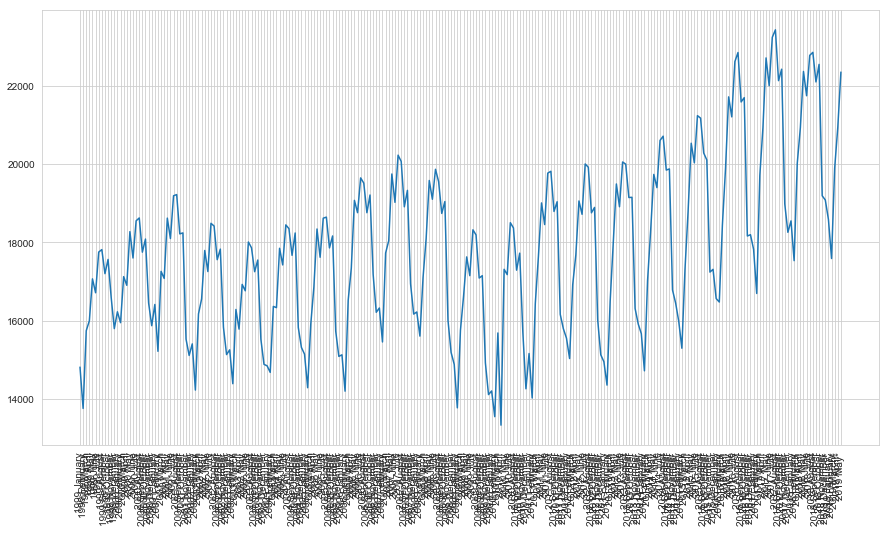

In [303]:
# Plot of floghts arriving at Schiphol along the history
plt.figure(figsize = (15,8))
plt.xticks(rotation=90)
plt.grid(True)
plt.plot(df_explore_schiphol['Periods'], df_explore_schiphol['Commercial air traffic/Flights/Arrivals/Total arrivals flights (number)'])
plt.show()

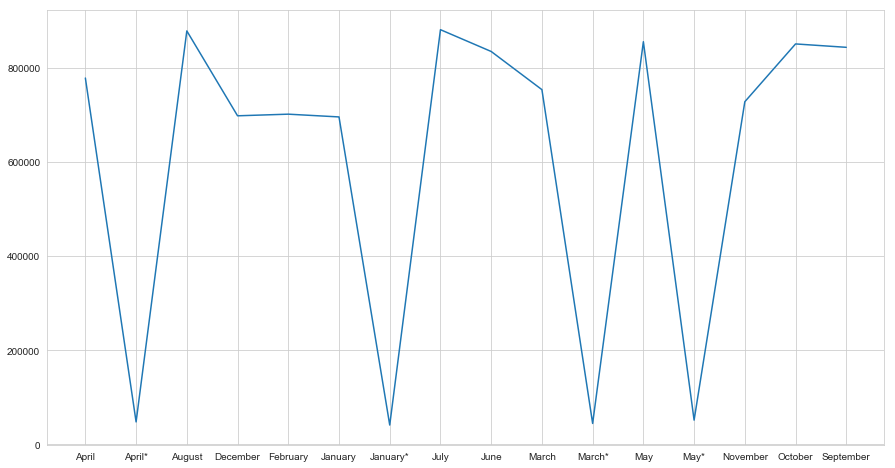

In [304]:
#have a look at the total flights for all the airports grouped by months
df_explore = df[['Commercial air traffic/Flights/All flights/Total flights (number)', 'Months']].groupby('Months').sum()
plt.figure(figsize = (15,8))
plt.grid(True)
plt.plot(df_explore.index, df_explore['Commercial air traffic/Flights/All flights/Total flights (number)'])
plt.show()
#plt.savefig('img/data_cleaning_dates.png', bbox_inches = 'tight');

In [377]:
# the asterisc symbol is shown as a different observation. * suggests that the figures for the current year are provisional.
#so let's remove the year of 2019 and its months from the dataset and plot the timeseries table again
df = df[df['Year'] < 2019]
df['Year'] = df['Year'].apply(str)

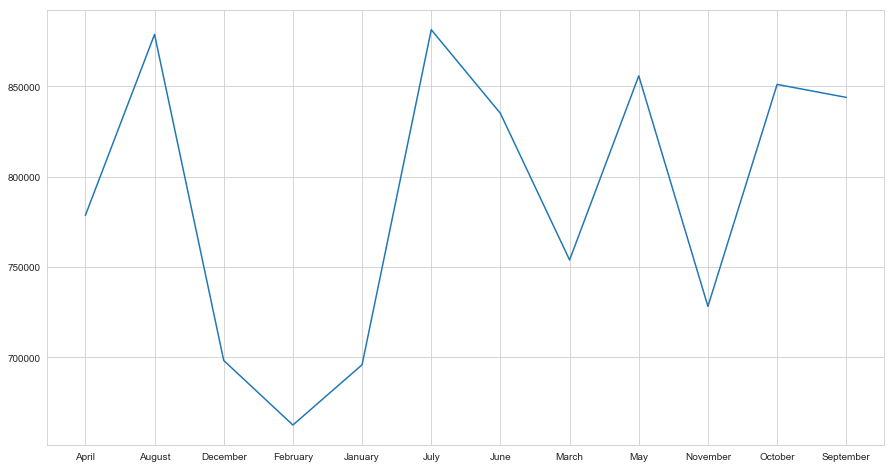

In [378]:
#have a look at the total flights for all the airports grouped by months
df_explore = df[['Commercial air traffic/Flights/All flights/Total flights (number)', 'Months']].groupby('Months').sum()

plt.figure(figsize = (15,8))
plt.grid(True)
plt.plot(df_explore.index, df_explore['Commercial air traffic/Flights/All flights/Total flights (number)'])
plt.show()
#plt.savefig('img/data_cleaning_dates.png', bbox_inches = 'tight');

In [307]:
df_explore = df[['Commercial air traffic/Flights/All flights/Total flights (number)', 'Year']].groupby('Year').sum()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


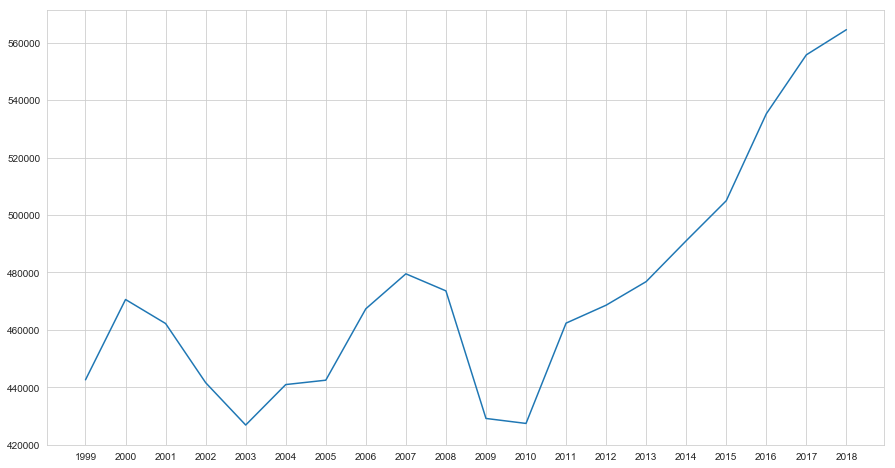

In [310]:
#have a look at the total flights for all the airports grouped by year
df_explore = df[['Commercial air traffic/Flights/All flights/Total flights (number)', 'Year']].groupby('Year').sum()
plt.figure(figsize = (15,8))
plt.grid(True)
plt.plot(df_explore.index, df_explore['Commercial air traffic/Flights/All flights/Total flights (number)']);
#plt.savefig('img/data_cleaning_dates.png', bbox_inches = 'tight');

# Functions to explore and plot cat/num cols

In [311]:
#for the catgeorical variables - the distributions of categorical variables
#compute and display a frequency table using the value_counts method. 
#A frequency table shows the frequency of each unique category of a categorical variable.

def count_unique(dataset, cols):
    for col in cols:
        print('\n' + 'For column ' + col)
        print(dataset[col].value_counts())

In [312]:
count_unique(df, df.columns)


For column Airports
Amsterdam Airport Schiphol     240
Maastricht Aachen Airport      240
Groningen Airport Eelde        240
Rotterdam The Hague Airport    240
Eindhoven Airport              240
Name: Airports, dtype: int64

For column Periods
2017 June         5
2018 March        5
2000 June         5
2011 September    5
2018 December     5
2015 November     5
1999 October      5
2006 November     5
2001 September    5
2003 December     5
2013 February     5
2009 August       5
2009 September    5
2004 September    5
2012 August       5
2002 January      5
2000 November     5
2002 May          5
2012 January      5
2000 May          5
2006 May          5
2009 March        5
2016 July         5
2000 October      5
2013 January      5
2003 March        5
2016 September    5
2004 December     5
2014 May          5
2016 August       5
2008 November     5
2001 March        5
2003 April        5
2007 May          5
1999 December     5
2012 May          5
2015 June         5
2014 December  

0        553
1         48
2         20
3         10
6          8
13         7
16         7
4          6
5          6
116        5
64         5
25         4
11         4
7          4
154        4
36         4
27         4
9          3
76         3
54         3
49         3
96         3
43         3
107        3
10         3
28         3
61         3
31         3
128        3
138        3
8          3
20         3
17         3
292        2
22089      2
68         2
238        2
269        2
77         2
85         2
273        2
87         2
185        2
130        2
97         2
132        2
313        2
111        2
188        2
119        2
57         2
120        2
254        2
127        2
134        2
101        2
168        2
60         2
34         2
44         2
24         2
14         2
48         2
12         2
24494      2
38         2
55         2
52         2
18         2
618        2
23         2
29         2
27115      1
10542      1
83         1
306        1
312        1

In [313]:
#for the numeric variables - display histograms
def plot_histogram(dataset, cols, bins = 20):
    for col in cols:
        fig = plt.figure(figsize=(6,6)) # define plot area
        ax = fig.gca() # define axis    
        dataset[col].plot.hist(ax = ax, bins = bins) # Use the plot.hist method on subset of the data frame
        ax.set_title('Histogram of ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel('No_of_observations')# Set text for y axis
        plt.show()

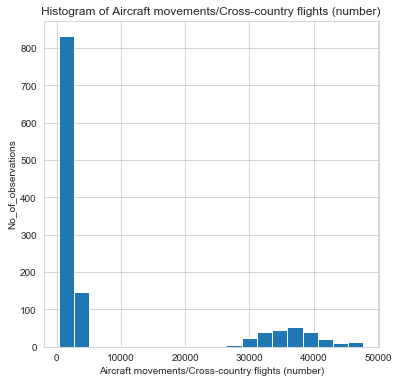

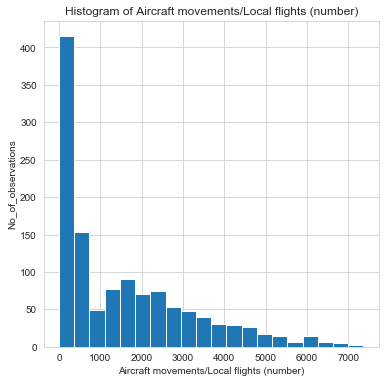

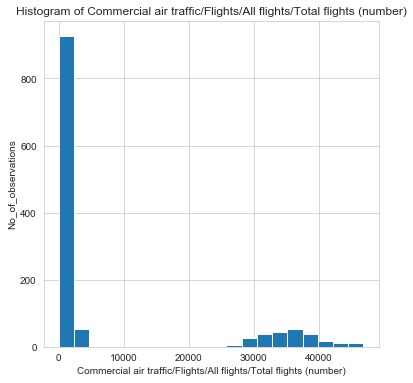

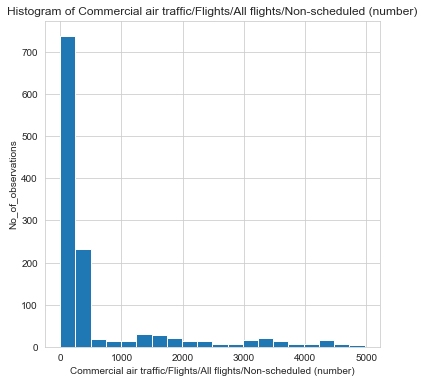

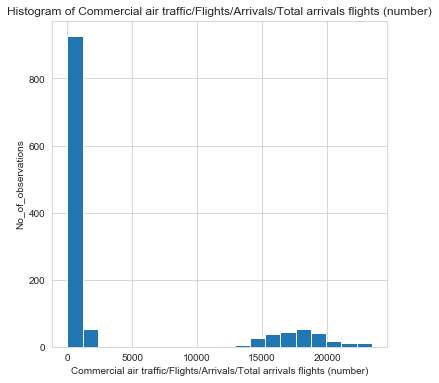

...

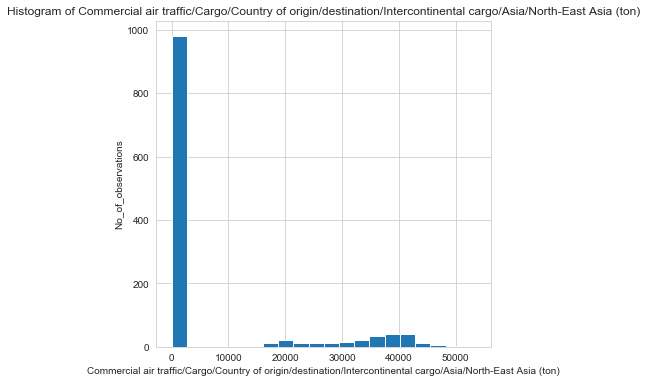

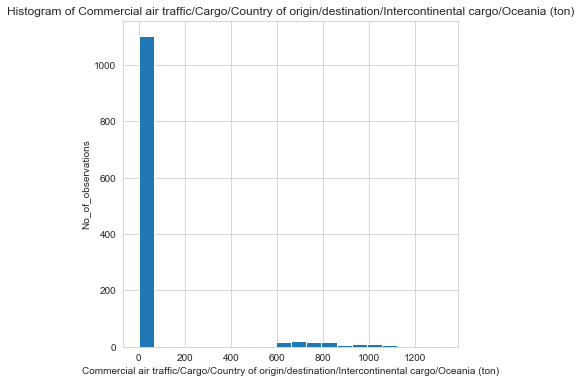

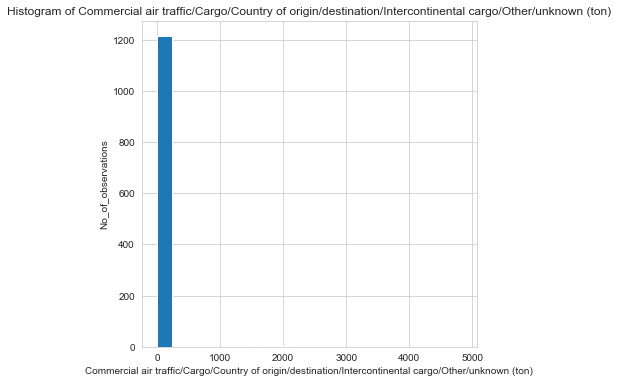

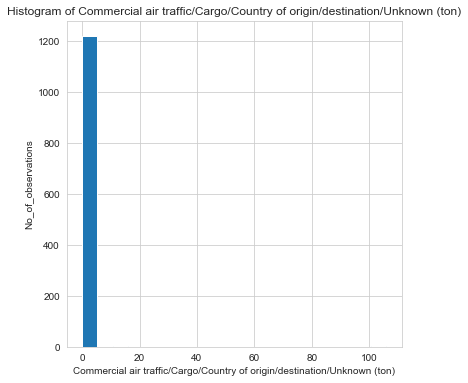

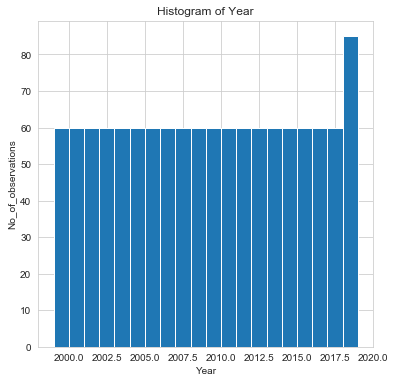

In [219]:
plot_histogram(df, df.describe().columns)

In [314]:
#plot the cols of interest grouped by the name of the airport
#get a list of the unique airports in NL
count_unique(df, df[['Airports']])


For column Airports
Amsterdam Airport Schiphol     240
Maastricht Aachen Airport      240
Groningen Airport Eelde        240
Rotterdam The Hague Airport    240
Eindhoven Airport              240
Name: Airports, dtype: int64


In [ ]:
#change the text to int in Month column
df['Months'] = pd.to_datetime(df['Months'], format = '%B')
df['Months'] = df['Months'].dt.month

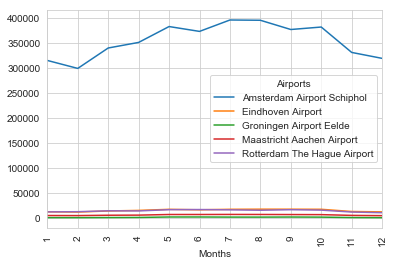

In [394]:
#plot total number of arrival flights per month and per airport
df_explore = df.groupby(['Airports', 'Months'], sort = True)['Commercial air traffic/Flights/Arrivals/Total arrivals flights (number)'].sum()
df_explore.unstack(level = 0).plot(rot = 90, xticks =pd.unique(df['Months']))

In [198]:
#for the numerical columns there is the possibility to analyze a density histogram
def plot_density_hist(dataset, cols, bins = 20, hist = False):
    for col in cols:
        sns.set_style("whitegrid")
        sns.distplot(dataset[col], bins = bins, rug=True, hist = hist)
        plt.title('Histogram of ' + col) # Give the plot a main title
        plt.xlabel(col) # Set text for the x axis
        plt.ylabel('Frequency ')# Set text for y axis
        plt.show()

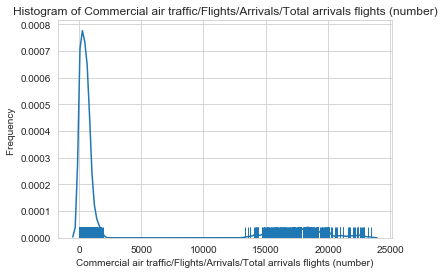

In [202]:
plot_density_hist(df, df[['Commercial air traffic/Flights/Arrivals/Total arrivals flights (number)']]) 

In [206]:
#forthe numerical values - some scatter plots
def plot_scatter(dataset, cols, col_y):
    for col in cols:
        fig = plt.figure(figsize=(7,6)) # define plot area
        ax = fig.gca() # define axis   
        dataset.plot.scatter(x = col, y = col_y, ax = ax)
        ax.set_title('Scatter plot of ' + col_y + ' vs. ' + col) # Give the plot a main title
        ax.set_xlabel(col) # Set text for the x axis
        ax.set_ylabel(col_y)# Set text for y axis
        plt.show()

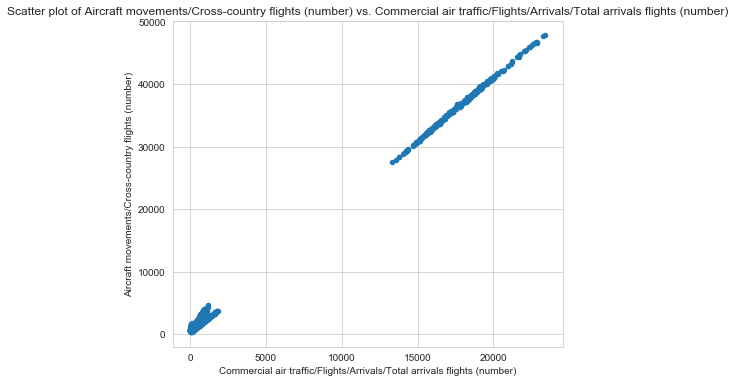

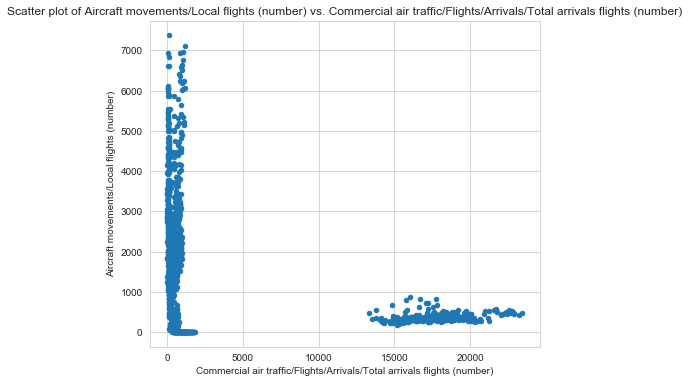

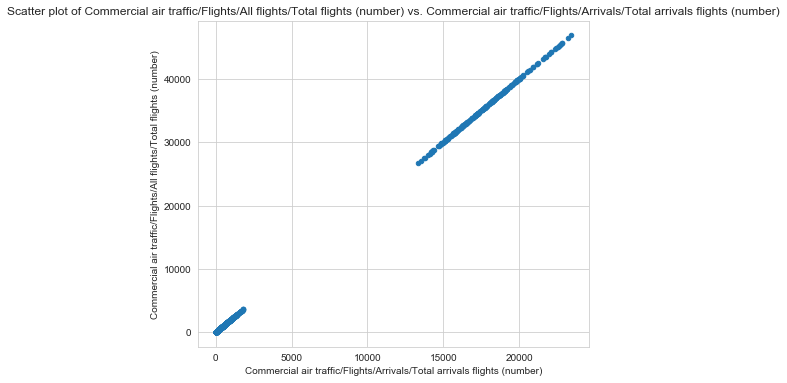

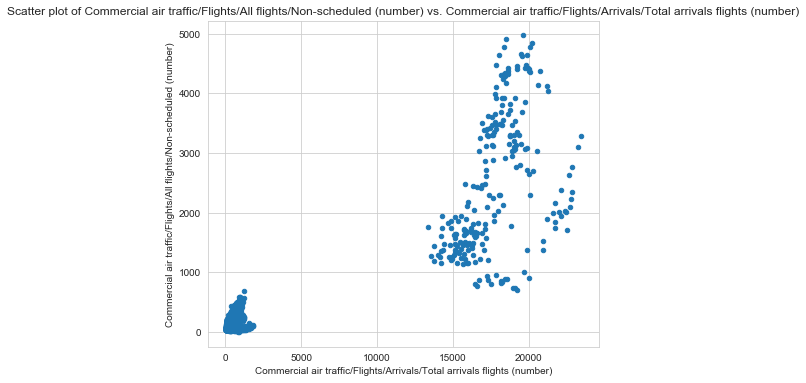

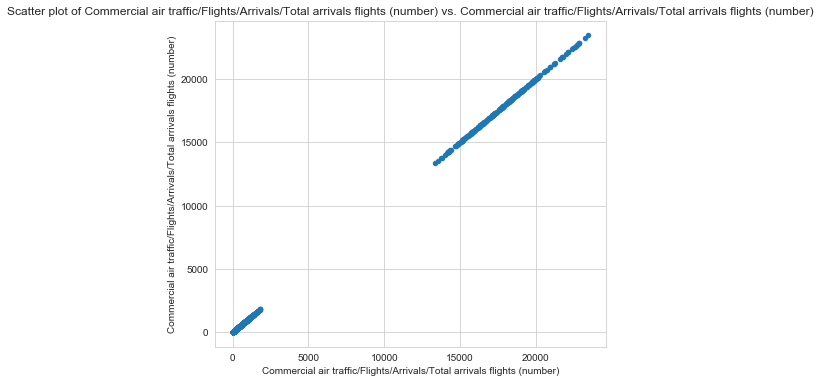

...

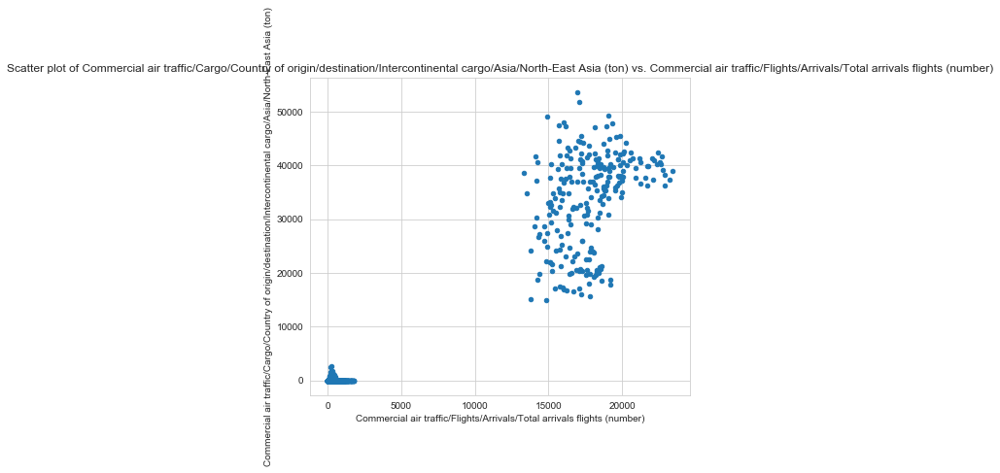

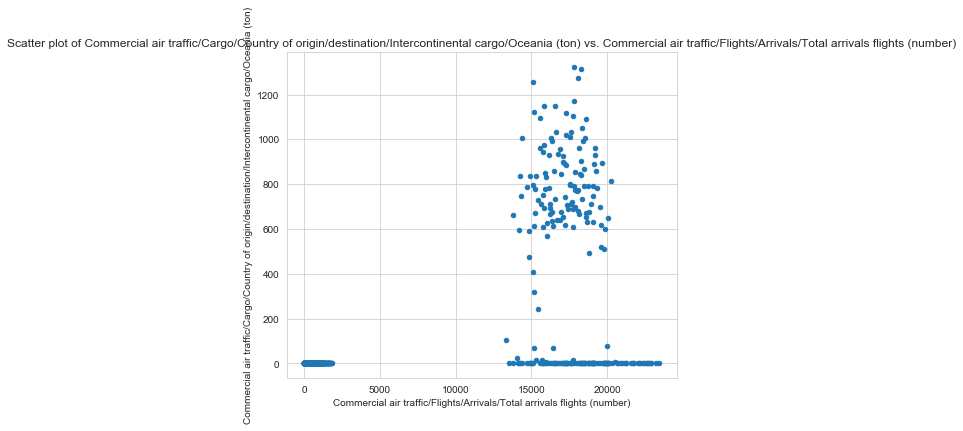

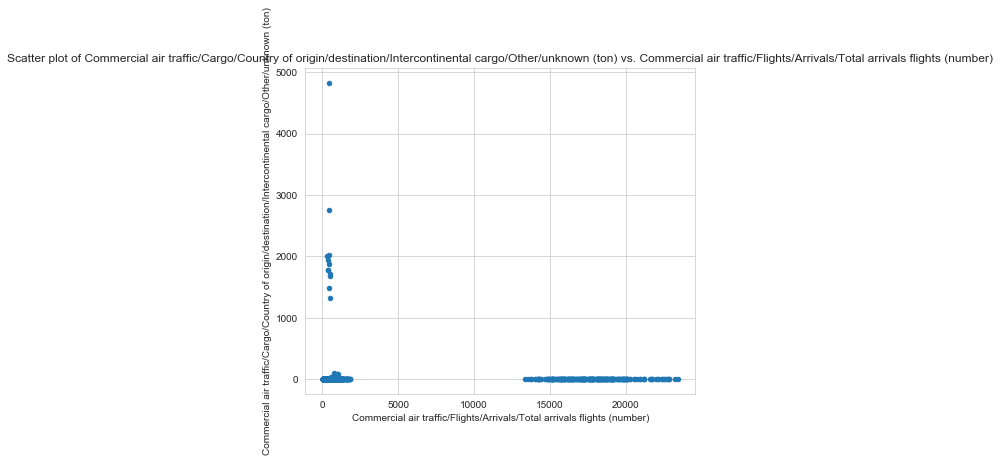

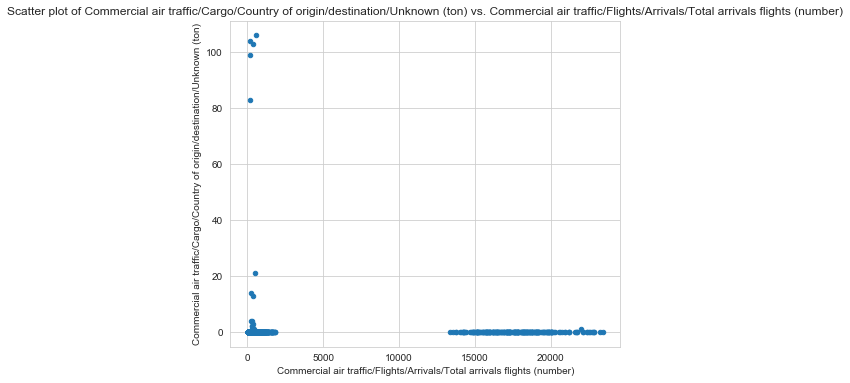

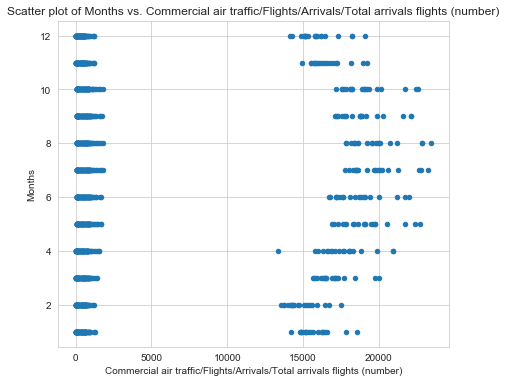

In [402]:
for col in df.describe().columns:
    plot_scatter(df, df[['Commercial air traffic/Flights/Arrivals/Total arrivals flights (number)']], col)